<a href="https://colab.research.google.com/github/surenoobster/MRI-CT-project/blob/main/cycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opendatasets

In [ ]:
import opendatasets as op
op.download('https://www.kaggle.com/datasets/darren2020/ct-to-mri-cgan/')

Skipping, found downloaded files in "./ct-to-mri-cgan" (use force=True to force download)


In [ ]:
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
import tensorflow_probability as tfp
tfd = tfp.distributions


image_shape = (256, 256, 3)
latent_space = 256
kernel = 3
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1

source_input = layers.Input(shape=image_shape, name='source')
target_input = layers.Input(shape=image_shape, name='target')

# Rest of your code...


In [ ]:
def sampling(args):
  z_mean, z_log_v = args
  batch = tf.shape(z_mean)[0]
  dim = tf.shape(z_mean)[1]
  e = K.random_normal(shape = (batch, dim))
  return z_mean + tf.exp(0.5*z_log_v)*e
def module(inputs, filter, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = module(x, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.maximum([x, y])
    return x

In [ ]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm, dilation_rate):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    return layers.MaxPooling2D()(conv), conv
def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm, dilation_rate):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.maximum([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm, dilation_rate)
    return x

In [ ]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights, latent_space_name):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation[0], kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation[0], kernel, use_norm, 1)
    x = layers.Flatten()(conv6)
    z_mean = tf.keras.layers.Dense(latent_space, name = "z_mean_{}".format(latent_space_name))(x)
    z_log_v = tf.keras.layers.Dense(latent_space, name = "z_log_v_{}".format(latent_space_name))(x)
    x = tf.keras.layers.Lambda(sampling,
                               output_shape = (latent_space,), name = latent_space_name)([z_mean, z_log_v])
    x = layers.Dense(conv7.shape[1]*conv7.shape[2]*conv7.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.0001),
                    activation = activation[1])(x)
    x = layers.Reshape((conv7.shape[1], conv7.shape[2], conv7.shape[3]))(x)
    dec0 = decoder(x, skip7, filter*64, padding, strides, kernel, activation[1], use_norm, 1)
    dec = decoder(dec0, skip6, filter*32, padding, strides, kernel, activation[1], use_norm, 1)
    dec1 = decoder(dec, skip5, filter*16, padding, strides, kernel, activation[1], use_norm, 1)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm, 1)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm, 1)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm, 1)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm, 1)
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    return m

In [ ]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation, kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation, kernel, use_norm, 1)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output3 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding, strides = 1,
                           )(conv7)
    output = layers.add([
        output,
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((4, 4))(conv5)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((6, 6))(conv4)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((11, 11))(conv3))
    ])
    m = models.Model(inputs = inputs, outputs = [output, output1, output2, output3], name = name)
    return m

In [ ]:
g_target = U_net(source_input, filter, padding,
                        strides, ['LeakyReLU', 'relu'], kernel, use_norm = True,
                        name = 'xTOy', weights = True, latent_space_name = 'target_latent_space')
g_source = U_net(target_input, filter, padding, strides,
                       ['LeakyReLU', 'relu'], kernel, use_norm = True,
                       name = 'yTOx', weights = True, latent_space_name = 'source_latent_space')
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [ ]:
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [ ]:
# discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'xx', weights = True)
# discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'yy', weights = True)
d_source.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_target.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_source.trainable = False
d_target.trainable = False
# forward cyclegan
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)
# backward
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)
gan = models.Model(inputs = [source_input, target_input],
                  outputs = [d_target_re, d_source_re,
                            recon_source_forward,
                            recon_target_backward,
                            g_target.get_layer('target_latent_space').output,
                            g_source.get_layer('source_latent_space').output
                             ],
                  name = 'generative_gan')
loss_weights = [2, 1, 0.7, 0.5, 2, 1, 0.7, 0.5, 10, 10, 0.5, 0.5]
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae',
          losses_normal_disribution, losses_normal_disribution]
gan.compile(loss = losses,
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay),
           loss_weights = loss_weights)

In [ ]:
gan.output

[[<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'yy')>],
 [<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'xx')>],
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'target_latent_space')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'source_latent_space')>]

In [ ]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [ ]:
source_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/images/trainA').glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/images/trainB').glob('*.*'))))

In [ ]:
import matplotlib.pyplot as plt
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (12, 3))
    for i in range(16):
        plt.subplot(2, 8, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [ ]:
generator = ImageDataGenerator(
    rotation_range = 0.1, width_shift_range = 0.05, height_shift_range= 0.05,
    shear_range = 0.05, zoom_range= 0.3, fill_mode = "constant",
    horizontal_flip = True, vertical_flip = True
)
def data_augmentation(images):
  final_images = []
  for index, value in enumerate(images):
    for i in range(2):
      new_image = generator.flow(np.reshape(value, (1, 256, 256, 3))).next()
      final_images.append(np.reshape(new_image, (256, 256, 3)))
  return np.array(final_images)

In [ ]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)
def get_normal_samples(batch_size):
  return tf.random.normal(shape = (batch_size, latent_space), mean = 0, stddev = 1)

Epoch: 0/2401
source_discr: 2.001835346221924, target_discr: 1.9508205652236938 source_ADV: 0.5177139528095722, target_ADV: 0.6644109562039375 
recon_target_loss :0.46474307775497437, recon_source_loss: 0.38325852155685425 
Normal Log loss: 17.746352195739746
Source to Target Samples


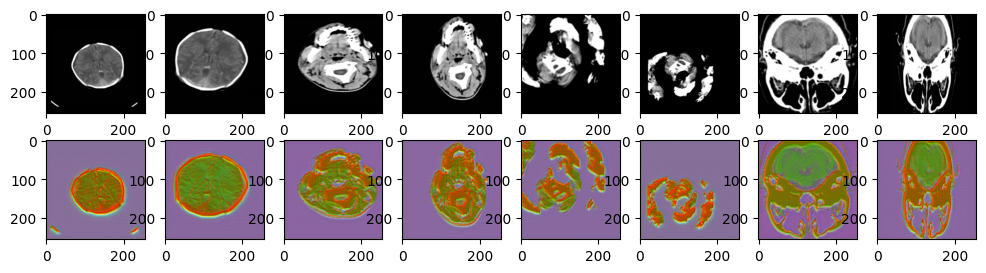

Target to Source Samples


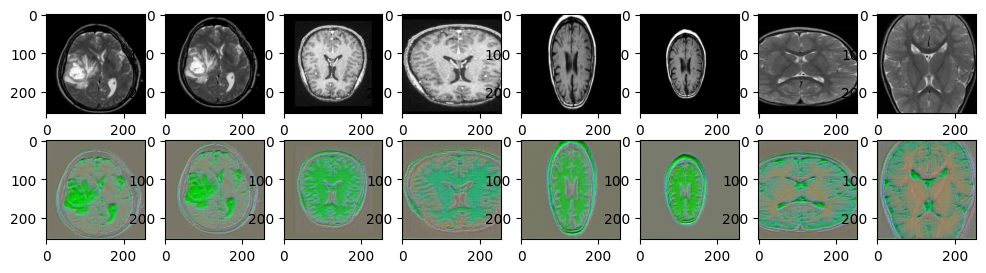

Epoch: 100/2401
source_discr: 0.46349552273750305, target_discr: 0.8122647404670715 source_ADV: 0.548601932823658, target_ADV: 0.6896447539329529 
recon_target_loss :0.08152100443840027, recon_source_loss: 0.1624407172203064 
Normal Log loss: 2.0494256019592285
Source to Target Samples


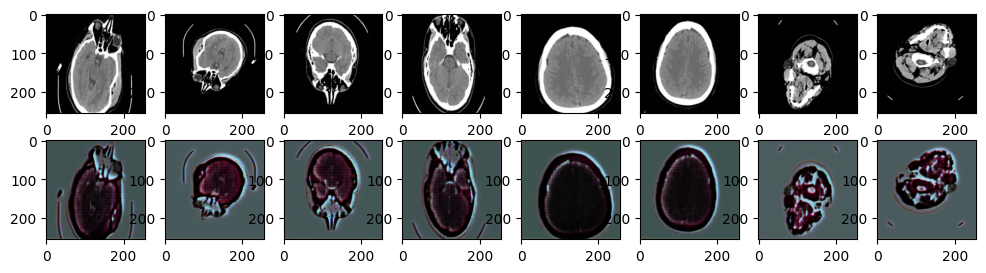

Target to Source Samples


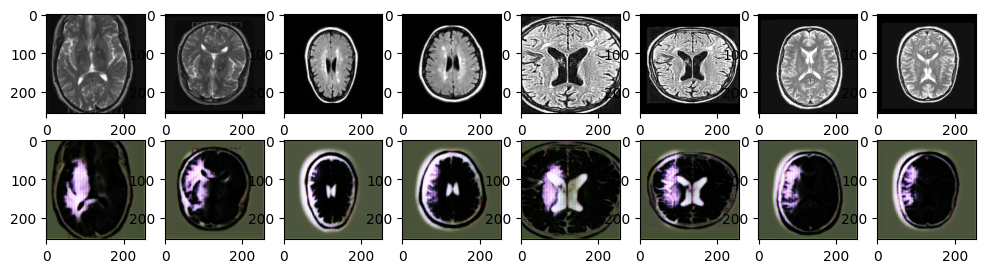

Epoch: 200/2401
source_discr: 0.8741600513458252, target_discr: 0.4794743061065674 source_ADV: 0.580733060836792, target_ADV: 0.23947900906205177 
recon_target_loss :0.0822562724351883, recon_source_loss: 0.18154802918434143 
Normal Log loss: 1.9405108094215393
Source to Target Samples


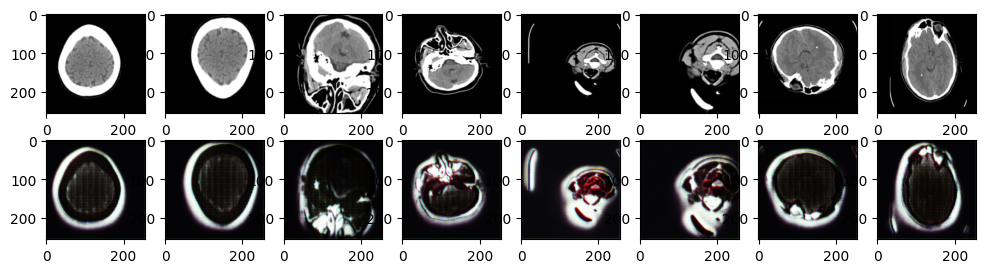

Target to Source Samples


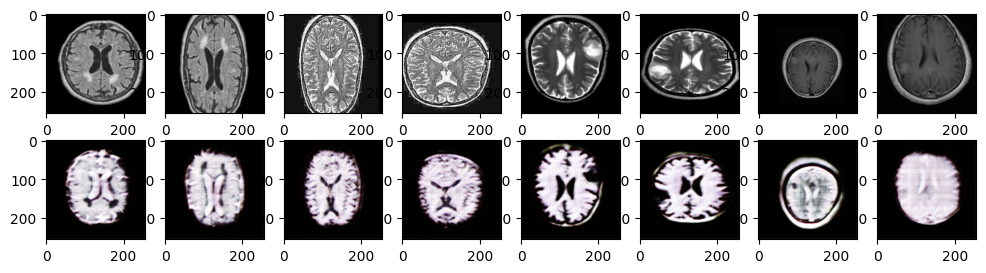

Epoch: 300/2401
source_discr: 0.8720282912254333, target_discr: 0.4348260462284088 source_ADV: 0.7394582852721214, target_ADV: 0.2919008322060108 
recon_target_loss :0.04196256399154663, recon_source_loss: 0.10663282126188278 
Normal Log loss: 1.9152892231941223
Source to Target Samples


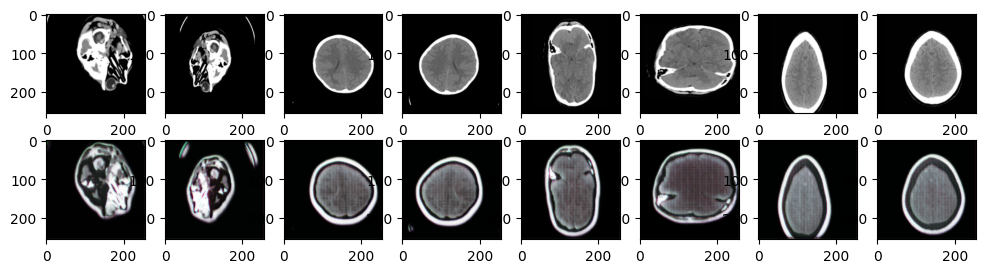

Target to Source Samples


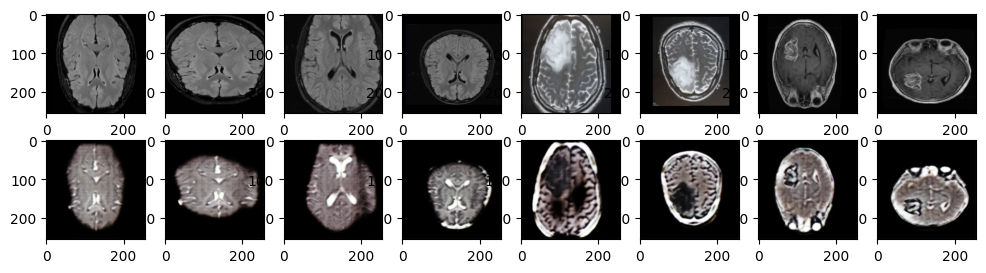

Epoch: 400/2401
source_discr: 0.834157407283783, target_discr: 1.7067493200302124 source_ADV: 0.6906557381153107, target_ADV: 0.2656663917005062 
recon_target_loss :0.05559340864419937, recon_source_loss: 0.10478458553552628 
Normal Log loss: 1.891561508178711
Source to Target Samples


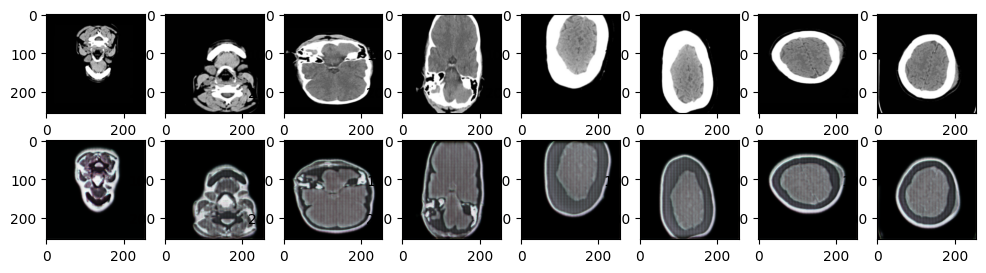

Target to Source Samples


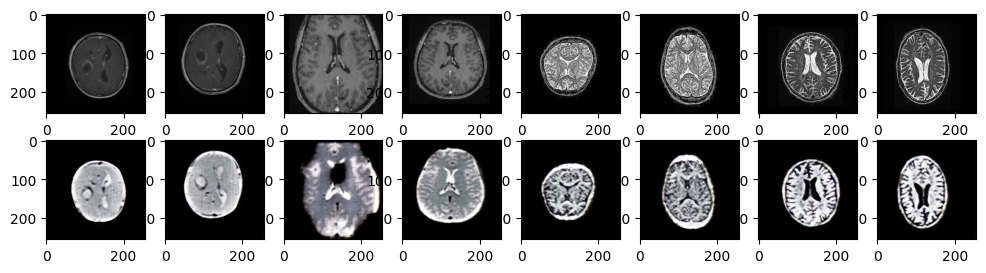

Epoch: 500/2401
source_discr: 0.645283043384552, target_discr: 0.558611273765564 source_ADV: 0.5033924207091331, target_ADV: 0.43336454778909683 
recon_target_loss :0.02201920747756958, recon_source_loss: 0.09892693907022476 
Normal Log loss: 1.8863441348075867
Source to Target Samples


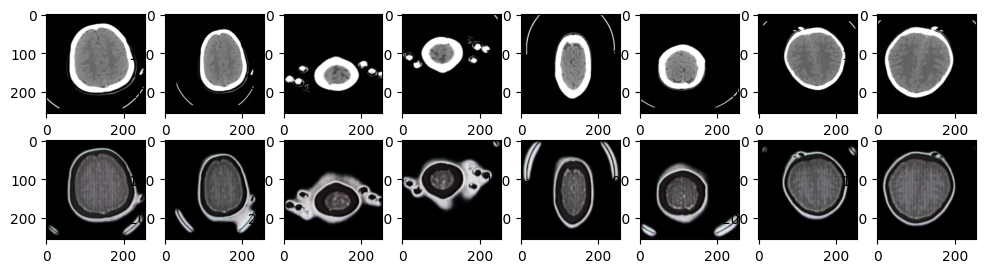

Target to Source Samples


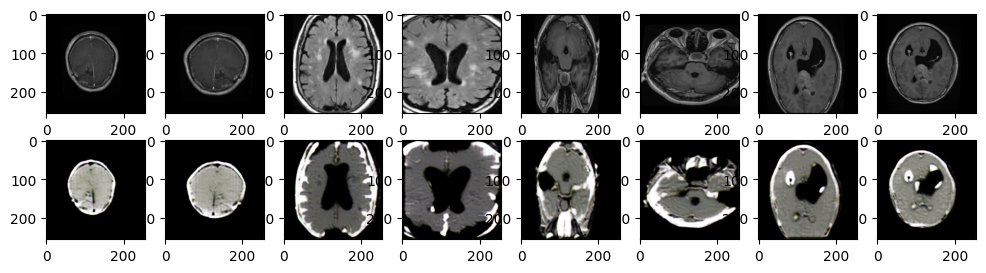

Epoch: 600/2401
source_discr: 0.8848726749420166, target_discr: 0.6724304556846619 source_ADV: 0.4750300645828247, target_ADV: 0.09863445349037647 
recon_target_loss :0.10581554472446442, recon_source_loss: 0.09513968229293823 
Normal Log loss: 1.8840840458869934
Source to Target Samples


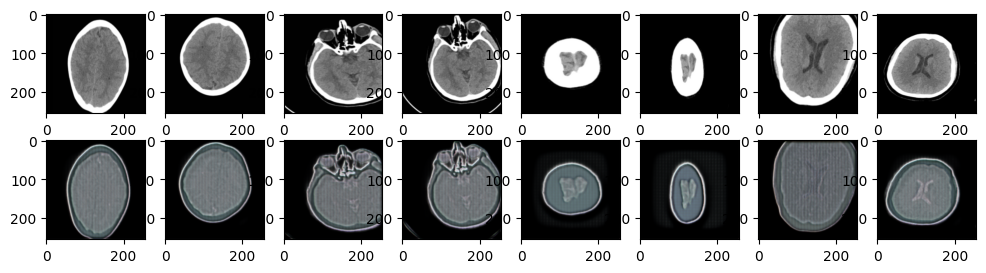

Target to Source Samples


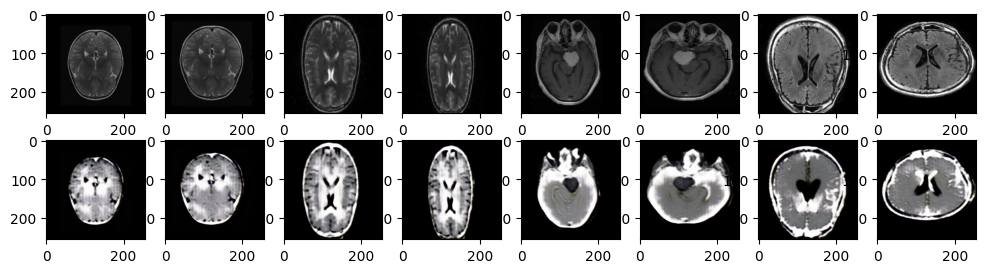

Epoch: 700/2401
source_discr: 0.8371471166610718, target_discr: 0.6353174448013306 source_ADV: 0.2984536252915859, target_ADV: 0.3272863179445267 
recon_target_loss :0.054215677082538605, recon_source_loss: 0.14728733897209167 
Normal Log loss: 1.8818912506103516
Source to Target Samples


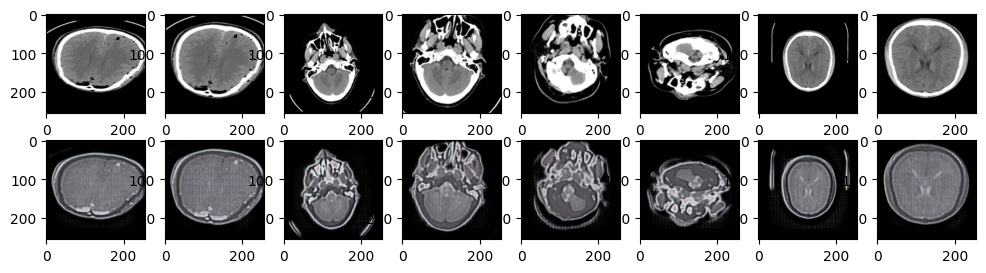

Target to Source Samples


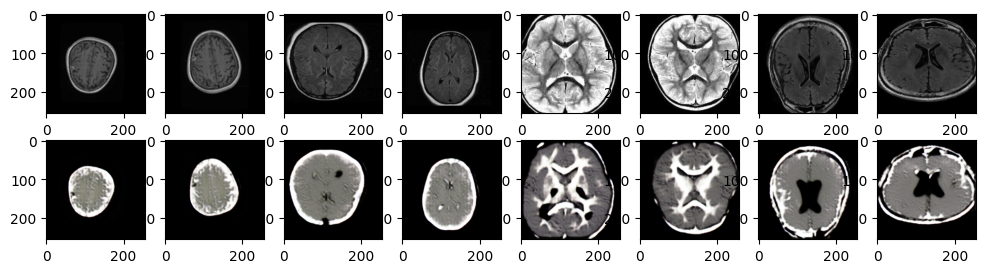

Epoch: 800/2401
source_discr: 1.83858060836792, target_discr: 0.6655189394950867 source_ADV: 0.36229538172483444, target_ADV: 0.7321129739284515 
recon_target_loss :0.04588780552148819, recon_source_loss: 0.08804372698068619 
Normal Log loss: 1.8739455938339233
Source to Target Samples


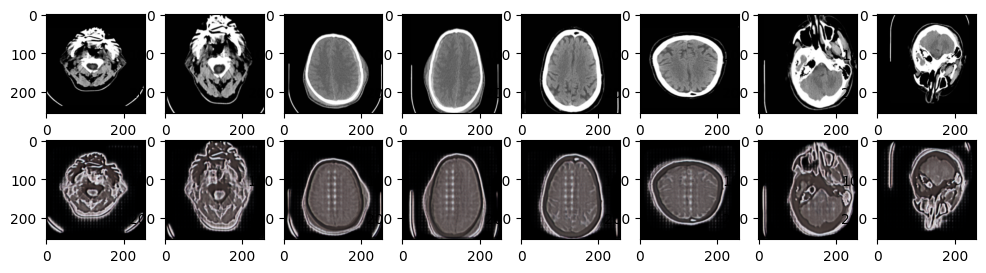

Target to Source Samples


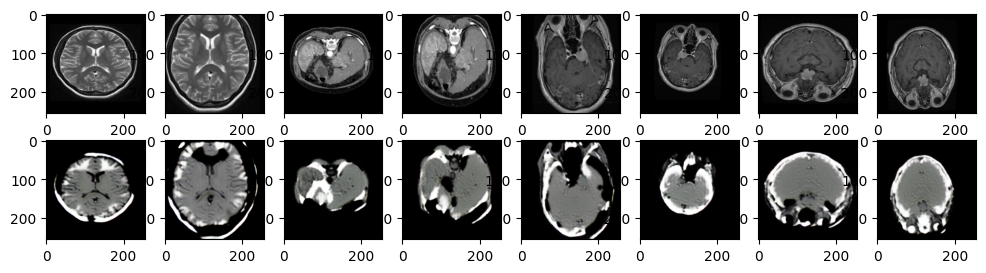

Epoch: 900/2401
source_discr: 0.77618807554245, target_discr: 0.7993211150169373 source_ADV: 0.38367364555597305, target_ADV: 0.3307266980409622 
recon_target_loss :0.04084578901529312, recon_source_loss: 0.07518584281206131 
Normal Log loss: 1.8665335774421692
Source to Target Samples


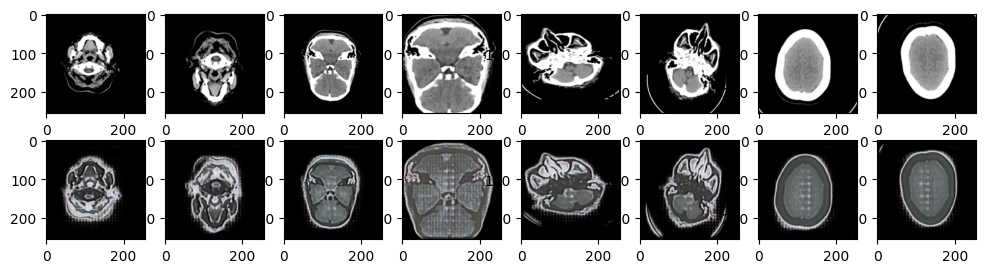

Target to Source Samples


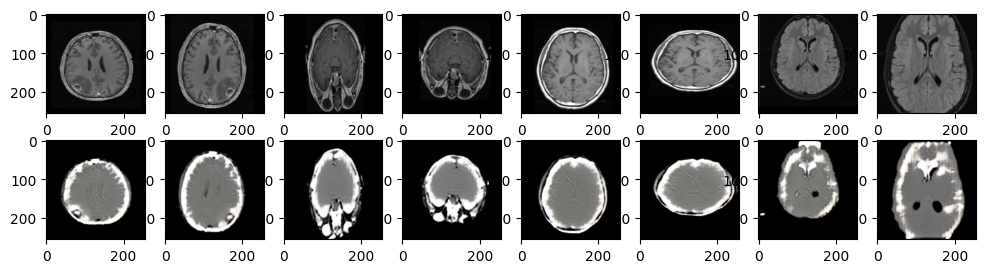

Epoch: 1000/2401
source_discr: 0.7836902737617493, target_discr: 0.8195163607597351 source_ADV: 0.2889637351036072, target_ADV: 0.26455654203891754 
recon_target_loss :0.03938876837491989, recon_source_loss: 0.15008381009101868 
Normal Log loss: 1.8655971884727478
Source to Target Samples


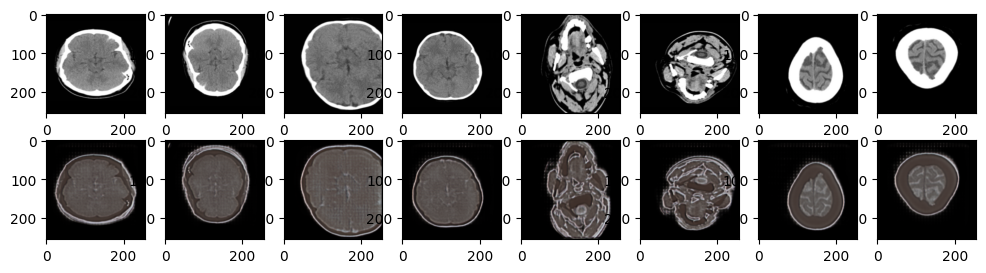

Target to Source Samples


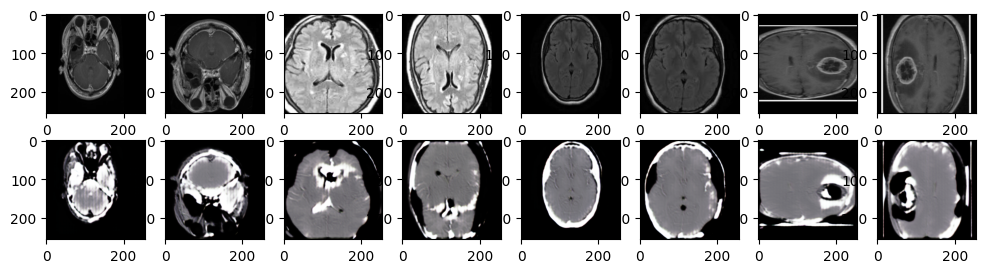

Epoch: 1100/2401
source_discr: 0.8570455312728882, target_discr: 0.8482376337051392 source_ADV: 0.42849352210760117, target_ADV: 0.31381334364414215 
recon_target_loss :0.05417352914810181, recon_source_loss: 0.11674126982688904 
Normal Log loss: 1.8663793802261353
Source to Target Samples


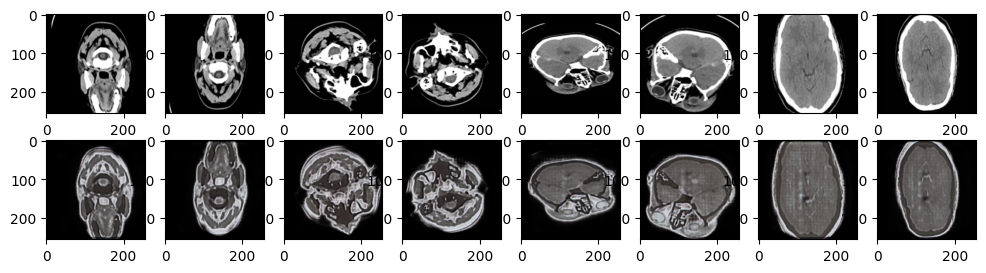

Target to Source Samples


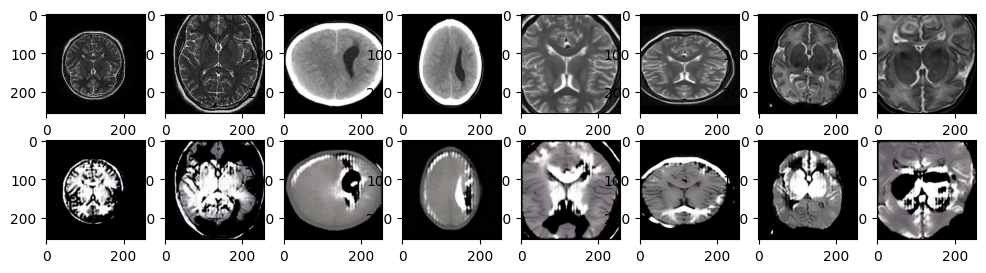

Epoch: 1200/2401
source_discr: 0.7986115217208862, target_discr: 0.6213897466659546 source_ADV: 0.6697392761707306, target_ADV: 0.22170012816786766 
recon_target_loss :0.0364951454102993, recon_source_loss: 0.08664022386074066 
Normal Log loss: 1.8625677824020386
Source to Target Samples


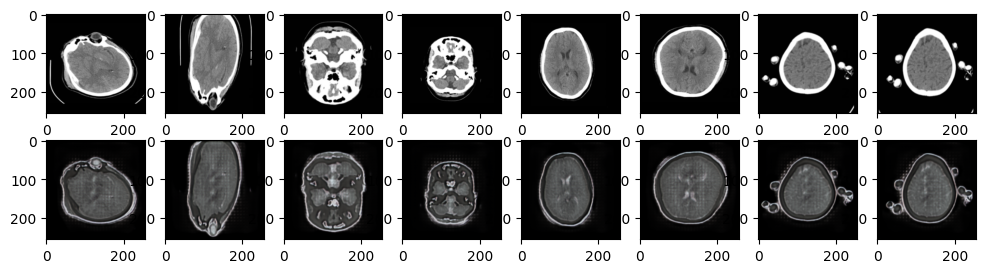

Target to Source Samples


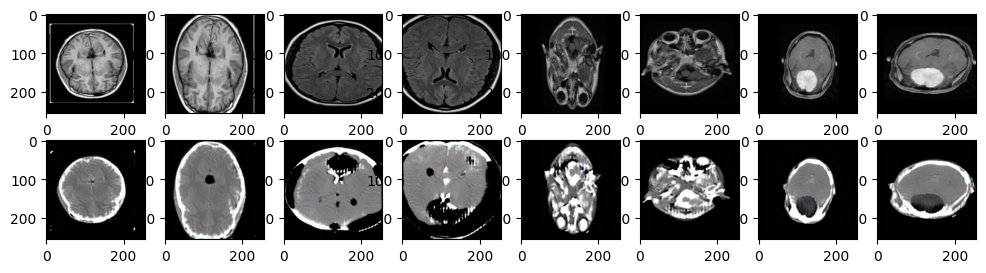

Epoch: 1300/2401
source_discr: 0.5963388681411743, target_discr: 0.5399665832519531 source_ADV: 0.5065651163458824, target_ADV: 0.48648180067539215 
recon_target_loss :0.0303249042481184, recon_source_loss: 0.07308706641197205 
Normal Log loss: 1.8607046008110046
Source to Target Samples


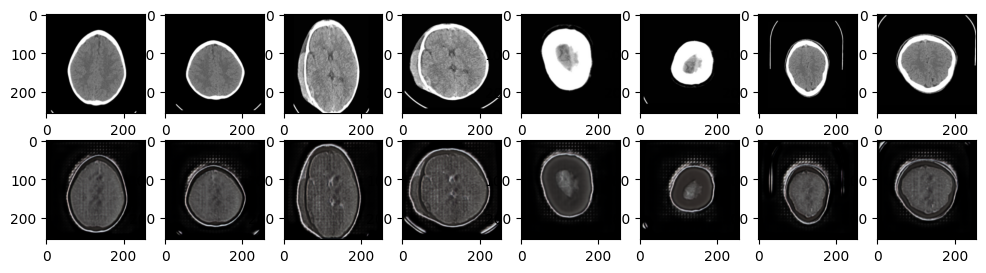

Target to Source Samples


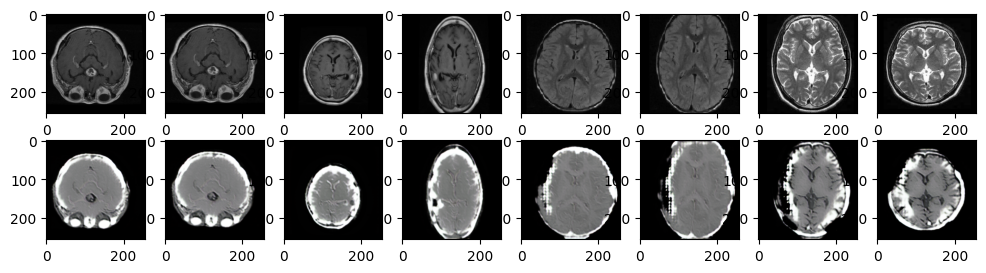

Epoch: 1400/2401
source_discr: 0.8904962539672852, target_discr: 1.711296796798706 source_ADV: 0.8071787357330322, target_ADV: 0.337873712182045 
recon_target_loss :0.03217377886176109, recon_source_loss: 0.07153867185115814 
Normal Log loss: 1.8592352271080017
Source to Target Samples


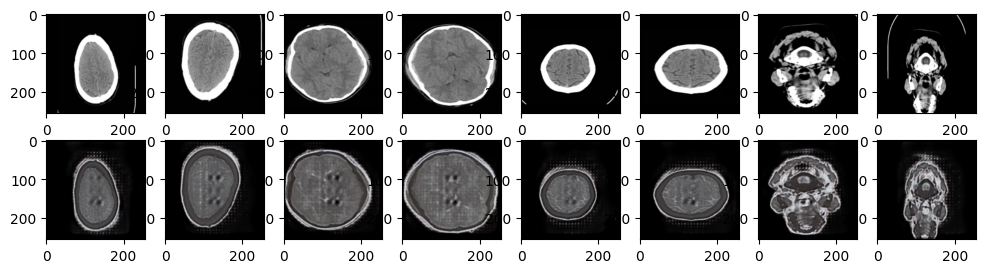

Target to Source Samples


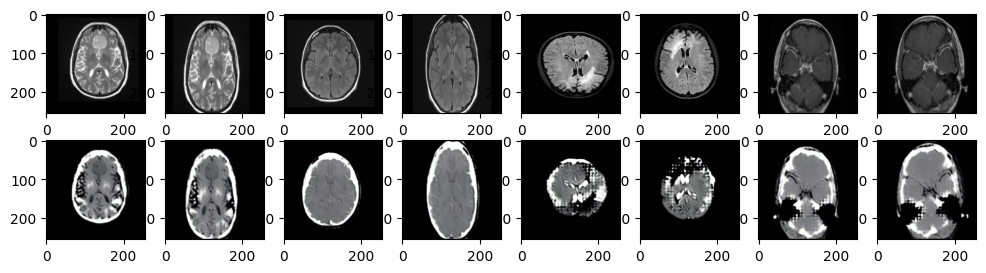

Epoch: 1500/2401
source_discr: 0.7981874346733093, target_discr: 0.6585996747016907 source_ADV: 0.5899307727813721, target_ADV: 0.30981187522411346 
recon_target_loss :0.05329759418964386, recon_source_loss: 0.0766250267624855 
Normal Log loss: 1.860983431339264
Source to Target Samples


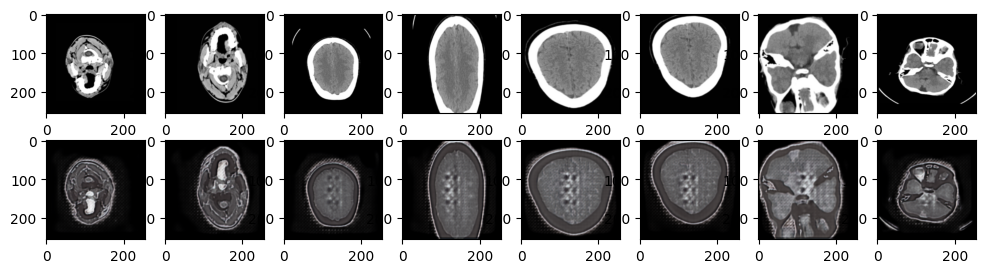

Target to Source Samples


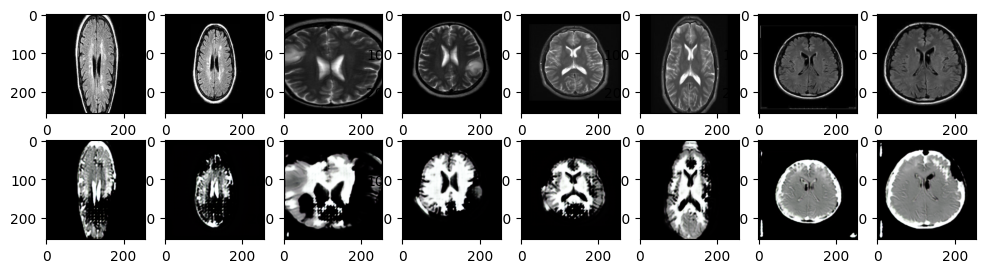

Epoch: 1600/2401
source_discr: 0.9049386978149414, target_discr: 0.8554508090019226 source_ADV: 0.26983318850398064, target_ADV: 0.2958221323788166 
recon_target_loss :0.046412136405706406, recon_source_loss: 0.08874966204166412 
Normal Log loss: 1.859631359577179
Source to Target Samples


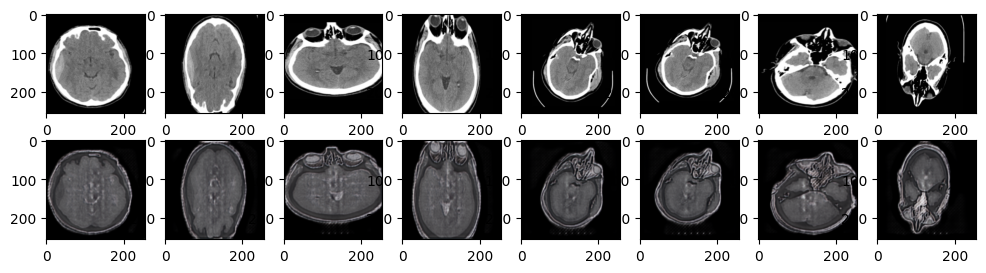

Target to Source Samples


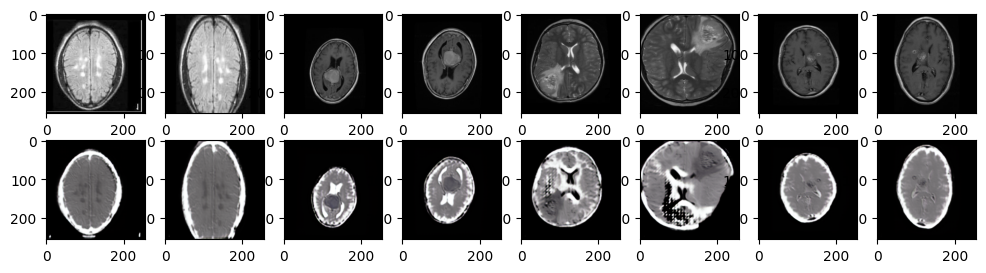

Epoch: 1700/2401
source_discr: 0.5577556490898132, target_discr: 0.851719081401825 source_ADV: 0.409807413816452, target_ADV: 0.5105881616473198 
recon_target_loss :0.049675412476062775, recon_source_loss: 0.11312806606292725 
Normal Log loss: 1.8571683168411255
Source to Target Samples


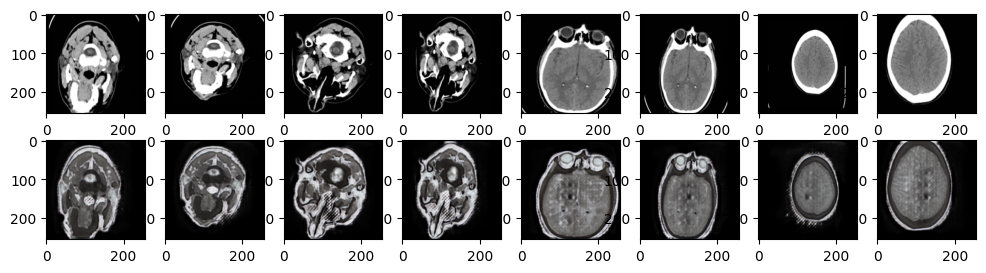

Target to Source Samples


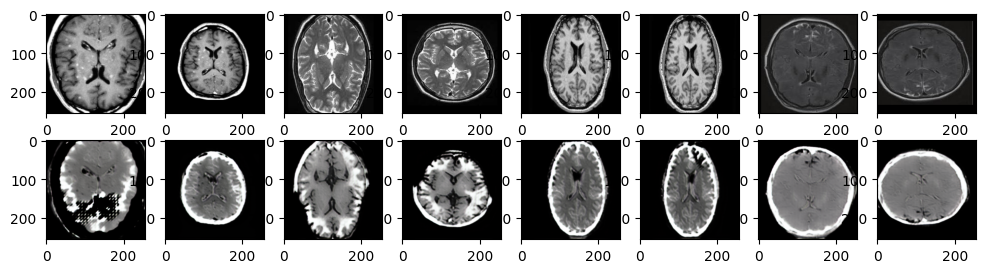

Epoch: 1800/2401
source_discr: 0.7245131731033325, target_discr: 0.7036529779434204 source_ADV: 0.2262733317911625, target_ADV: 0.6495007574558258 
recon_target_loss :0.04426458850502968, recon_source_loss: 0.08788283169269562 
Normal Log loss: 1.8569936156272888
Source to Target Samples


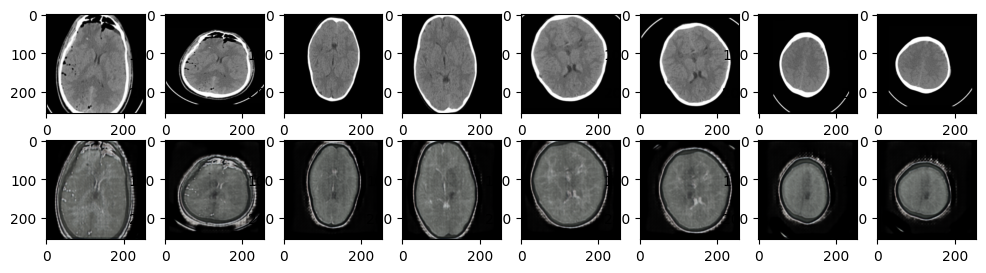

Target to Source Samples


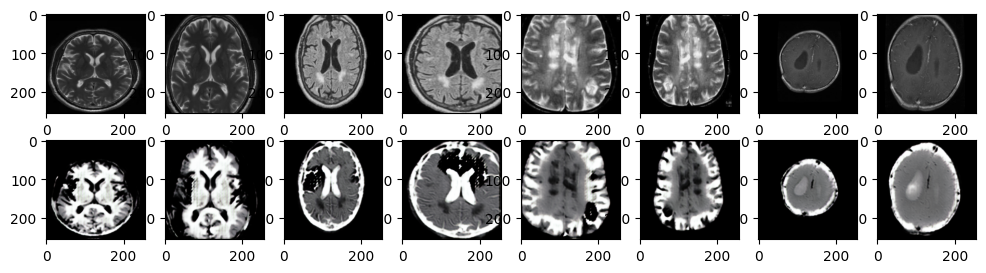

Epoch: 1900/2401
source_discr: 0.6713731288909912, target_discr: 0.7593283653259277 source_ADV: 0.4565245658159256, target_ADV: 0.44997718185186386 
recon_target_loss :0.03932084143161774, recon_source_loss: 0.09112895280122757 
Normal Log loss: 1.8589760661125183
Source to Target Samples


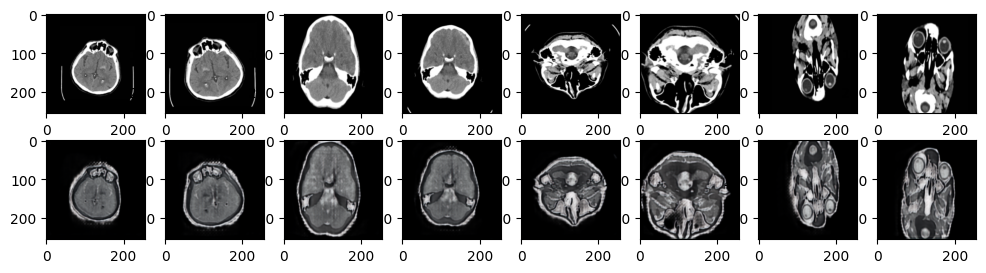

Target to Source Samples


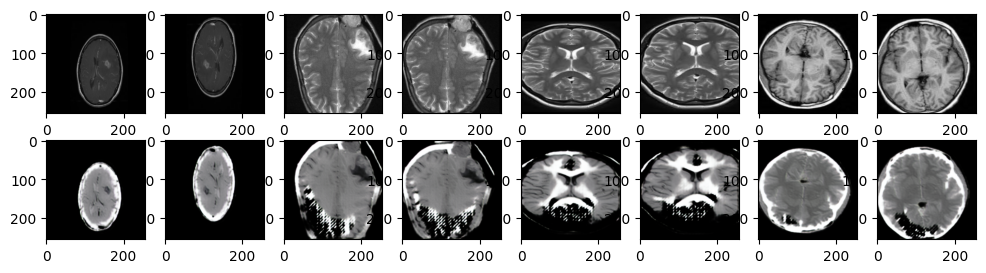

Epoch: 2000/2401
source_discr: 0.49854445457458496, target_discr: 1.2258236408233643 source_ADV: 0.700705274939537, target_ADV: 0.6330777779221535 
recon_target_loss :0.02697800099849701, recon_source_loss: 0.1044883206486702 
Normal Log loss: 1.8550564646720886
Source to Target Samples


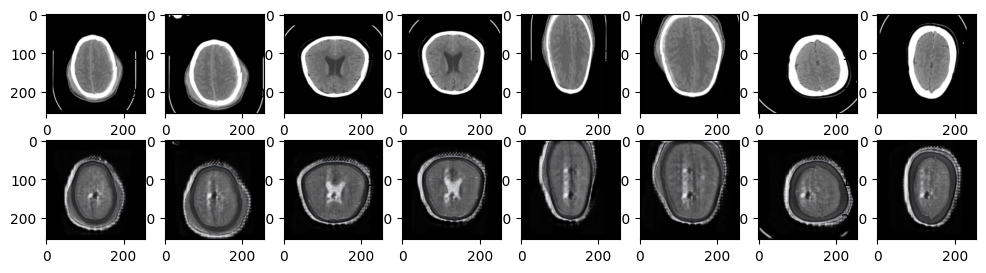

Target to Source Samples


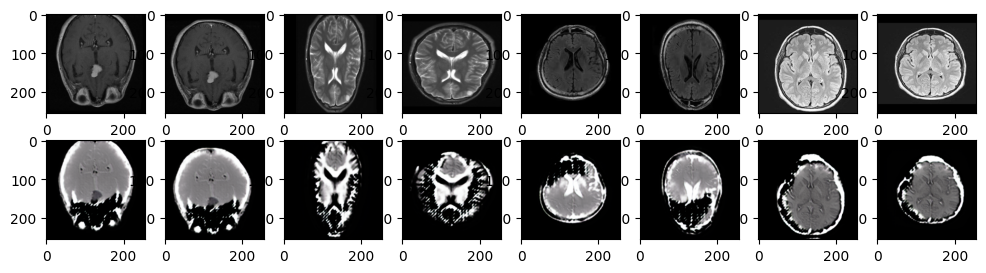

Epoch: 2100/2401
source_discr: 0.5571844577789307, target_discr: 0.5564164519309998 source_ADV: 0.42474165558815, target_ADV: 0.6199947372078896 
recon_target_loss :0.05368302762508392, recon_source_loss: 0.10865546762943268 
Normal Log loss: 1.8604266047477722
Source to Target Samples


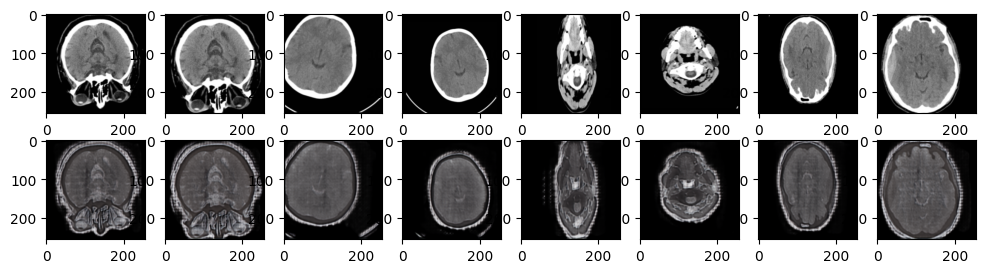

Target to Source Samples


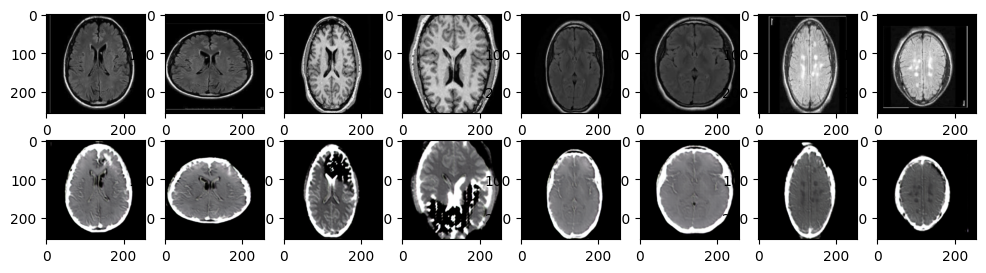

Epoch: 2200/2401
source_discr: 0.426668643951416, target_discr: 0.5756490230560303 source_ADV: 0.4299669936299324, target_ADV: 0.5069763511419296 
recon_target_loss :0.04080960899591446, recon_source_loss: 0.08722935616970062 
Normal Log loss: 1.8553780317306519
Source to Target Samples


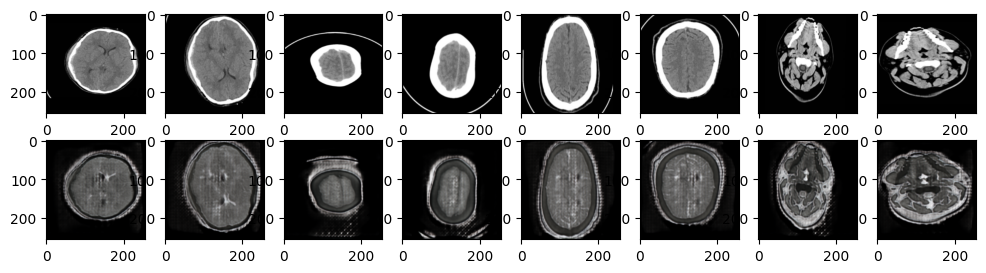

Target to Source Samples


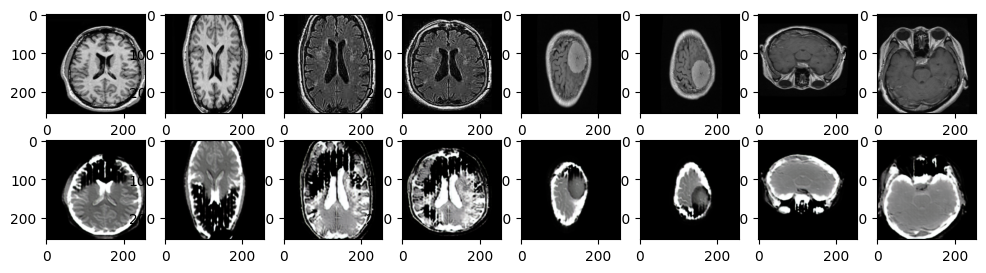

Epoch: 2300/2401
source_discr: 0.4829566478729248, target_discr: 0.8657766580581665 source_ADV: 0.030139848357066512, target_ADV: 0.7288167774677277 
recon_target_loss :0.04119039699435234, recon_source_loss: 0.05610227584838867 
Normal Log loss: 1.8555431365966797
Source to Target Samples


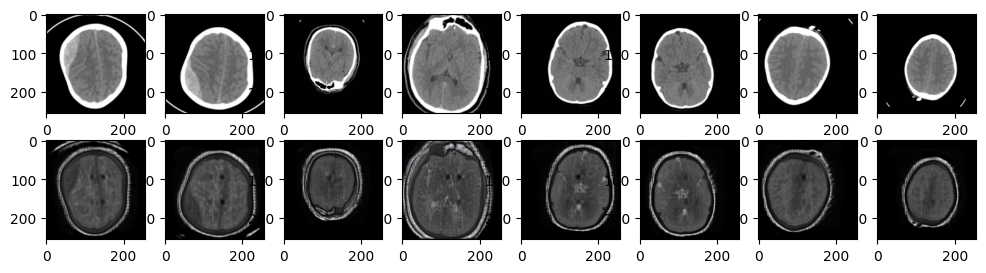

Target to Source Samples


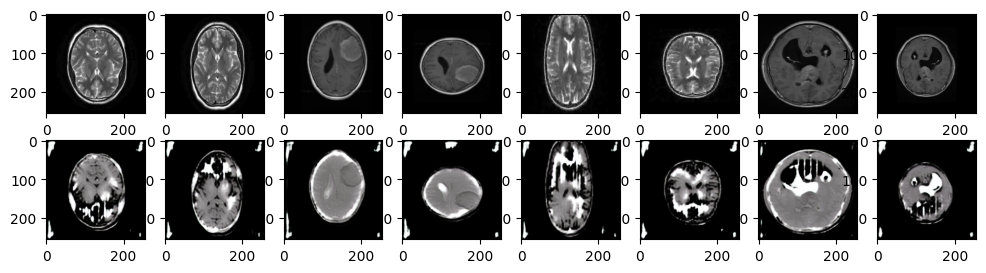

Epoch: 2400/2401
source_discr: 0.40497344732284546, target_discr: 1.1571828126907349 source_ADV: 0.569516122341156, target_ADV: 0.6075245067477226 
recon_target_loss :0.036116499453783035, recon_source_loss: 0.09832114726305008 
Normal Log loss: 1.8567054271697998
Source to Target Samples


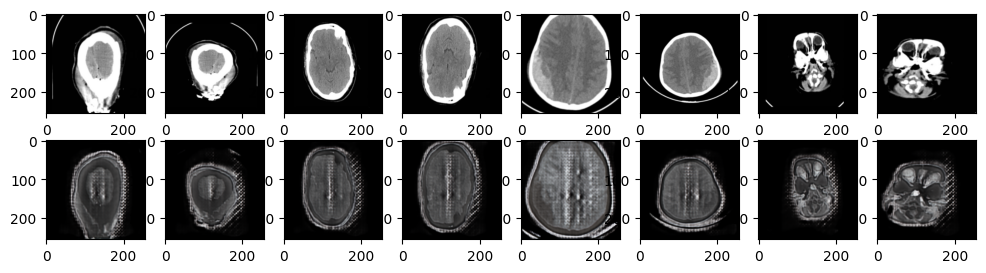

Target to Source Samples


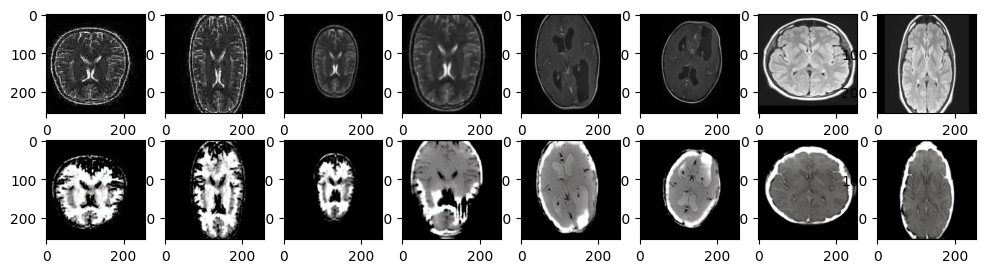

In [ ]:
epochs = 2401
batch_size = 4
batch_after_augmentation = batch_size*2
patchGan = (batch_after_augmentation, 2, 2, 1)
patchGan1 = (batch_after_augmentation, 8, 8, 1)
patchGan2 = (batch_after_augmentation, 16, 16, 1)
patchGan3 = (batch_after_augmentation, 32, 32, 1)
for i in range(epochs):
    indexs = np.random.randint(1740, size = (batch_size,))
    source_images = data_augmentation(read_images(source_pathes[indexs]))
    target_images = data_augmentation(read_images(target_pathes[indexs]))
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, fake_source])
    allImagesTarget = np.vstack([real_target, fake_target])
    all_d_source, d1, d2, d3, d4  = d_source.train_on_batch(allImagesSource, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3, dt4  = d_target.train_on_batch(allImagesTarget, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_1_4, loss_2_1, loss_2_2, loss_2_3, loss_2_4, loss_3, loss_4, nloss1, nloss2 = gan.train_on_batch([real_source, real_target],
                                                       [[ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       [ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       get_normal_samples(batch_after_augmentation),
                                                       get_normal_samples(batch_after_augmentation)])

    if i%100 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_ADV: {}, target_ADV: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 + loss_1_4)/4,
                                                            (loss_2_1 + loss_2_2 + loss_2_3 + loss_2_4)/4)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ')
        print('Normal Log loss: {}'.format((nloss1 + nloss2)))
        print('Source to Target Samples')
        samples(g_target, real_source)
        print('Target to Source Samples')
        samples(g_source, real_target)

In [ ]:
def draw_compare(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 16))
  index = 0
  n = 0
  for i in range(36):
    plt.subplot(6, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()
def generator_samples(pathes_, m, type_):
  indexs = np.random.randint(1700, size = (18,))
  images = read_images(pathes_[indexs])
  draw_compare(np.squeeze(m.predict(images, verbose = 0)), images, type_)

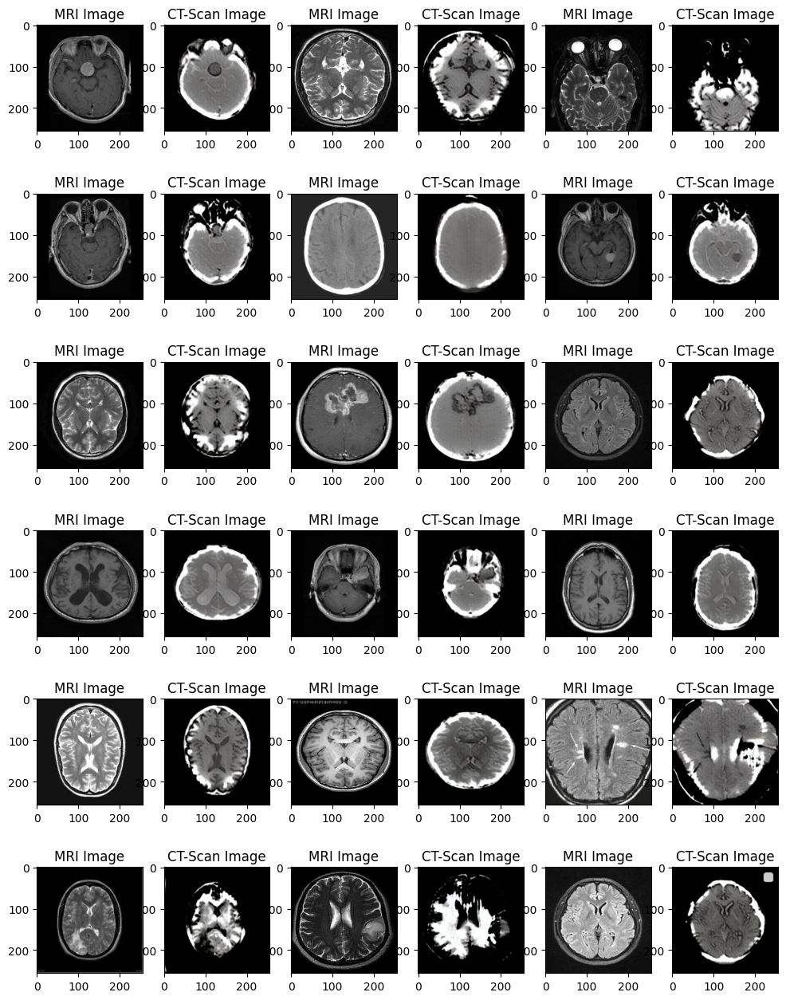

In [ ]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

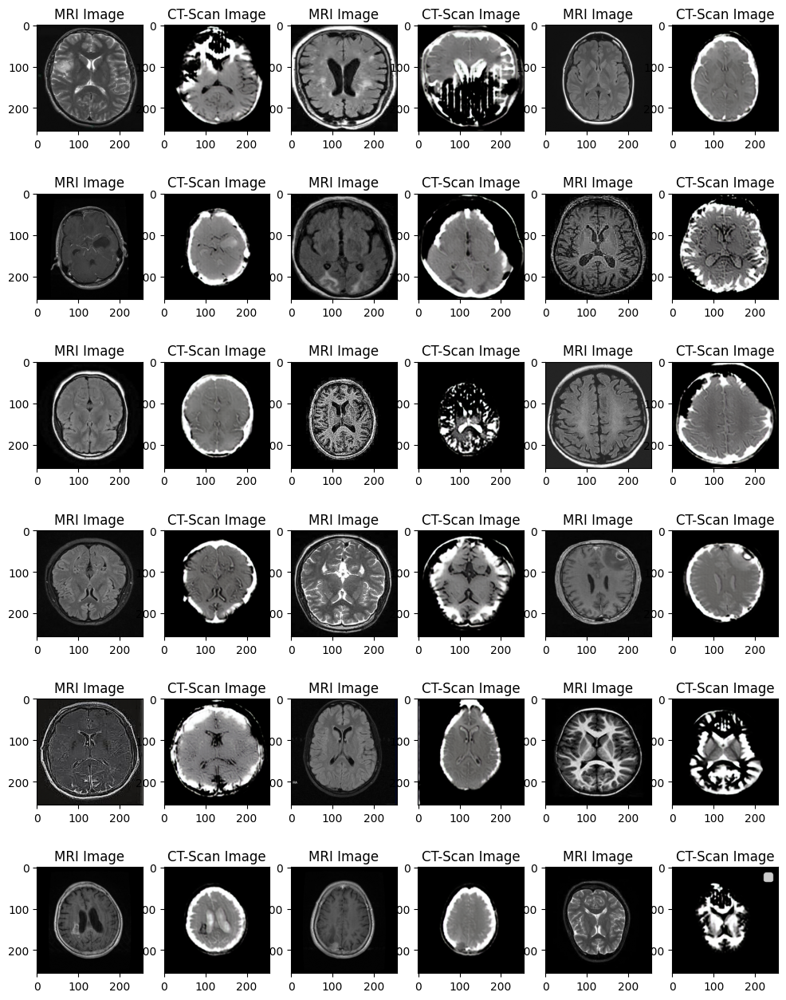

In [ ]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

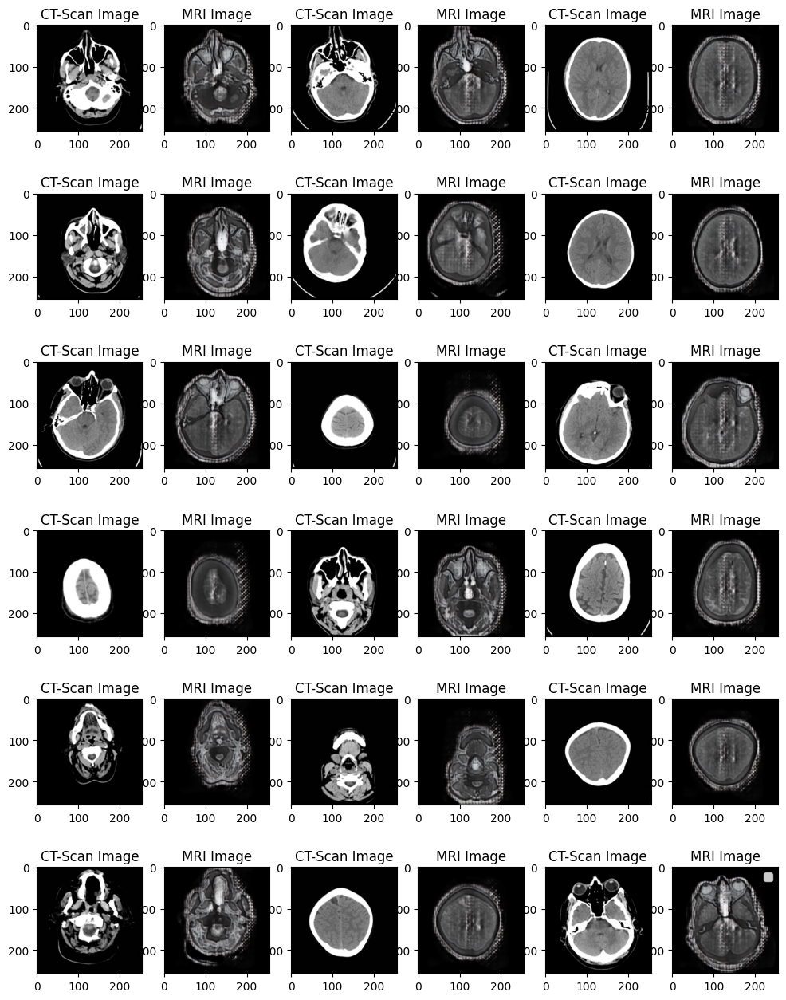

In [ ]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

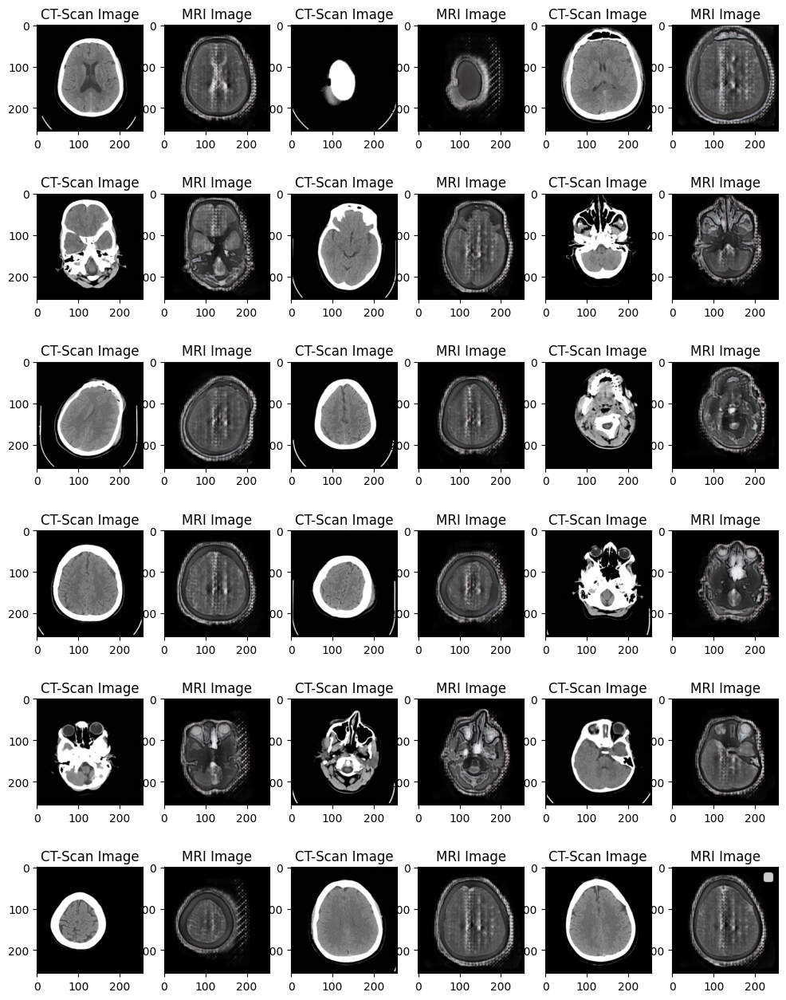

In [ ]:

generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

In [ ]:
def draw_samples(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 9))
  index = 0
  n = 0
  for i in range(24):
    plt.subplot(4, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [ ]:
ct_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/unseen_demo_images/ct').glob('*.*'))))
mri_pathes = np.array(sorted(list(pathlib.Path('ct-to-mri-cgan/Dataset/unseen_demo_images/mri').glob('*.*'))))

In [ ]:
ctImagesGeneration = g_source.predict(g_target.predict(read_images(ct_pathes)))
ctImagesGeneration.shape

1/1 [==============================] - 0s 133ms/step


(15, 256, 256, 3)

In [ ]:
ctOrginalImages = read_images(ct_pathes)
ctOrginalImages.shape

(15, 256, 256, 3)

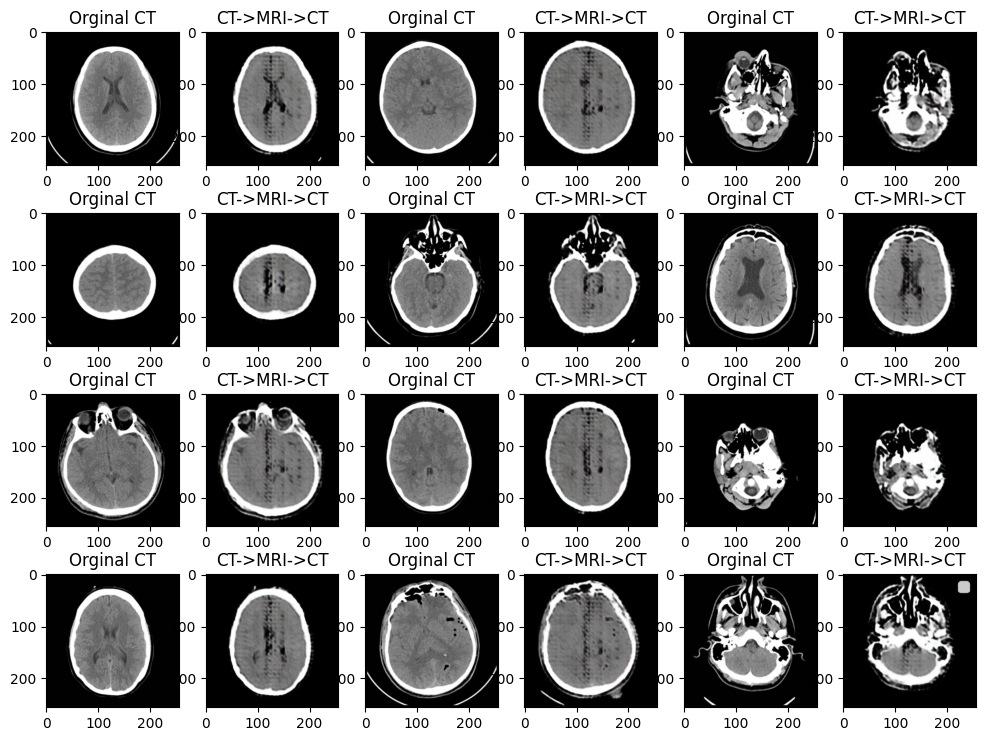

In [ ]:
draw_samples(ctImagesGeneration, ctOrginalImages, ['Orginal CT', 'CT->MRI->CT'])

In [ ]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(ctOrginalImages),
                                                 tf.keras.layers.Flatten()(ctImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.27803388>

In [ ]:
mriImagesGeneration = g_target.predict(g_source.predict(read_images(mri_pathes)))
mriImagesGeneration.shape

1/1 [==============================] - 0s 105ms/step


(15, 256, 256, 3)

In [ ]:
mriOrginalImages = read_images(mri_pathes)
mriOrginalImages.shape

(15, 256, 256, 3)

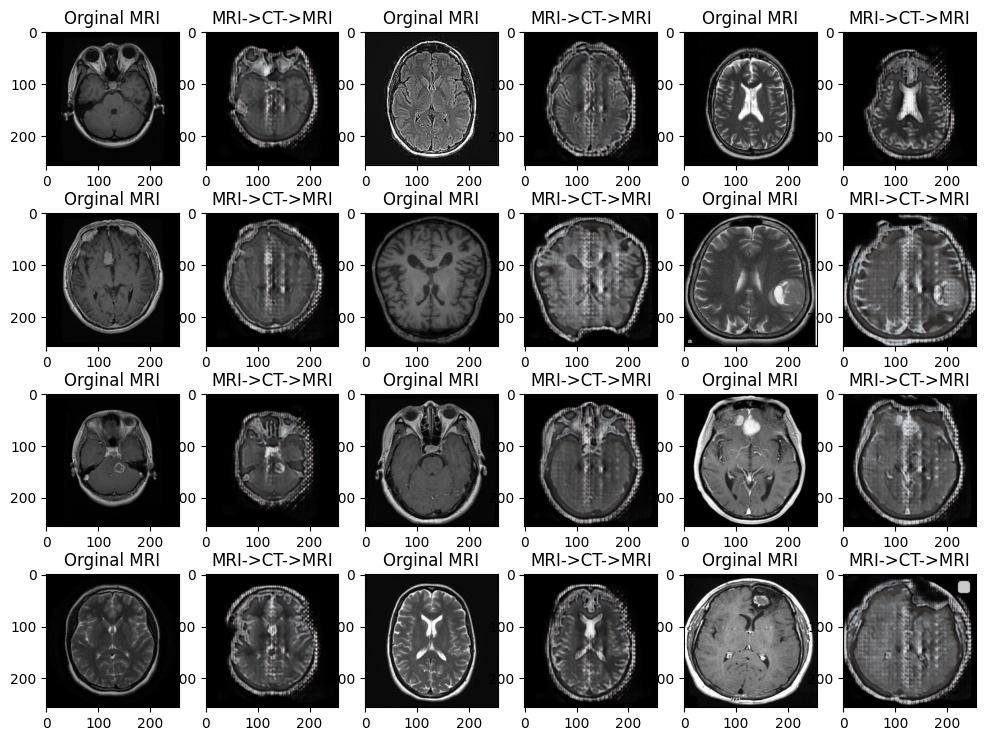

In [ ]:
draw_samples(mriImagesGeneration, mriOrginalImages, ['Orginal MRI', 'MRI->CT->MRI'])

In [ ]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(mriOrginalImages),
                                                 tf.keras.layers.Flatten()(mriImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.44794932>